In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.rcParams['font.size'] = 8
plt.rcParams['figure.figsize'] = (8,8)

import os
import numpy as np
import cv2
import pickle

from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.preprocessing.image import load_img, img_to_array
from keras import backend as K

from sklearn.cluster import KMeans

Using TensorFlow backend.


In [2]:
# 导入图片

img_width, img_height, channels = 128, 128, 3
input_shape = (img_width, img_height, channels)

def load_data():
    dir = 'taptap_logo'
    files = ["%s/%s" % (dir, x) for x in os.listdir(dir)]
    arr = np.empty((len(files), img_width, img_height, channels), dtype=np.float32)
    for i, imgfile in enumerate(files):
        img = load_img(imgfile)
        x = img_to_array(img).reshape(img_width, img_height, channels)
        x = x.astype('float32') / 255.
        arr[i] = x
    return arr

X = load_data()

print(X.shape)

/home/zh/anaconda3/lib/python3.6/site-packages/PIL/Image.py:888: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


(46735, 128, 128, 3)


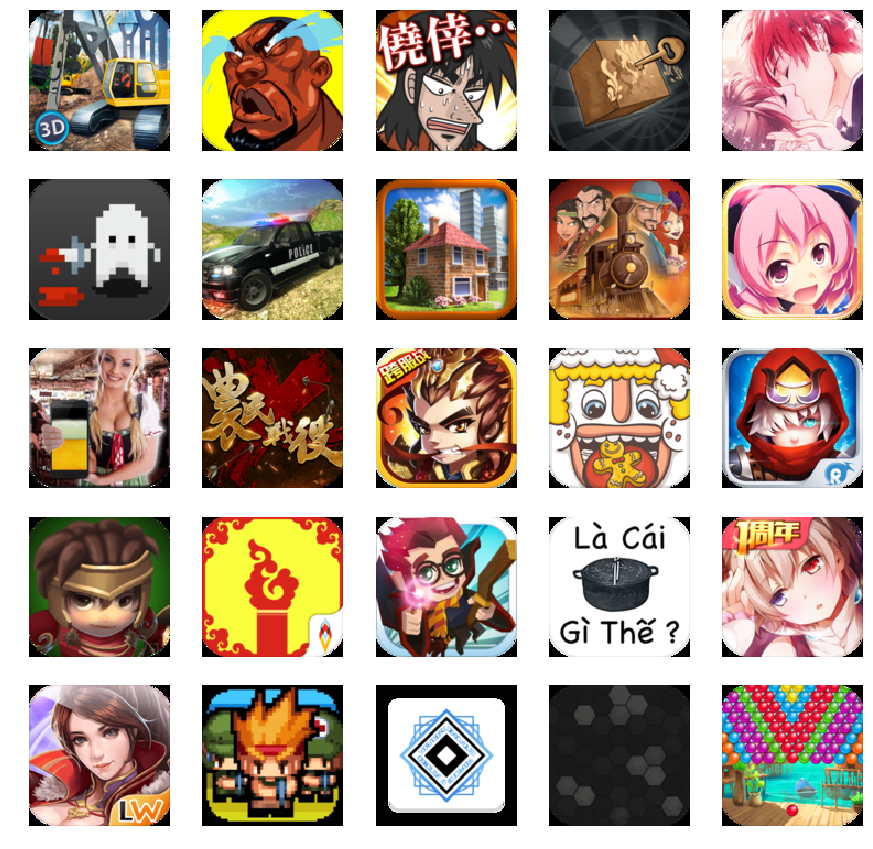

In [3]:
# 显示部分图片

nb_rows, nb_cols = 5, 5
plt.figure(figsize=(15,15))
for k in range(nb_rows * nb_cols):
    plt.subplot(nb_rows, nb_cols, k+1)
    plt.imshow(X[k])
    plt.axis('off')

In [5]:
# 将数据保存为 numpy 格式, 方便重复使用

np.save('taptap-game-logo.npy', X)

In [4]:
# 搭建 autoencoder 模型

model = Sequential()

# encoder 部分: ( conv + relu + maxpooling ) * 3
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape, padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
model.add(Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))

# decoder 部分: ( conv + relu + upsampling ) * 3 与 encoder 过程相反
model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(3, kernel_size=(3, 3), activation='sigmoid', padding='same'))

model.compile(loss='binary_crossentropy', optimizer='adadelta', metrics=['accuracy'])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 16)        4624      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 8)         1160      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 8)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 8)         584       
__________

In [6]:
# 训练

model.fit(X, X, epochs=20, batch_size=128, shuffle=True)

Epoch 1/20
46735/46735 [==============================] - 70s - loss: 0.5869 - acc: 0.1039    
Epoch 2/20
46735/46735 [==============================] - 64s - loss: 0.5237 - acc: 0.1127    
Epoch 3/20
46735/46735 [==============================] - 64s - loss: 0.5113 - acc: 0.1133    
Epoch 4/20
46735/46735 [==============================] - 64s - loss: 0.5039 - acc: 0.1137    
Epoch 5/20
46735/46735 [==============================] - 64s - loss: 0.4994 - acc: 0.1139    
Epoch 6/20
46735/46735 [==============================] - 64s - loss: 0.4963 - acc: 0.1141    
Epoch 7/20
46735/46735 [==============================] - 64s - loss: 0.4938 - acc: 0.1143    
Epoch 8/20
46735/46735 [==============================] - 64s - loss: 0.4919 - acc: 0.1145    
Epoch 9/20
46735/46735 [==============================] - 64s - loss: 0.4892 - acc: 0.1147    
Epoch 10/20
46735/46735 [==============================] - 64s - loss: 0.4862 - acc: 0.1147    
Epoch 11/20
46735/46735 [========================

Before autoencoding:


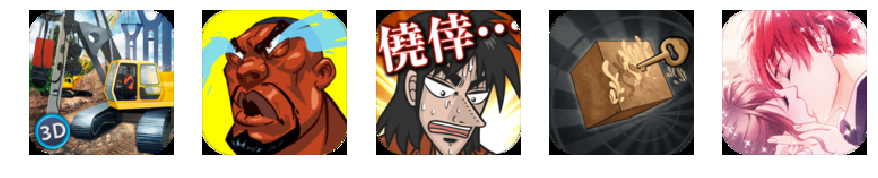

After decoding:


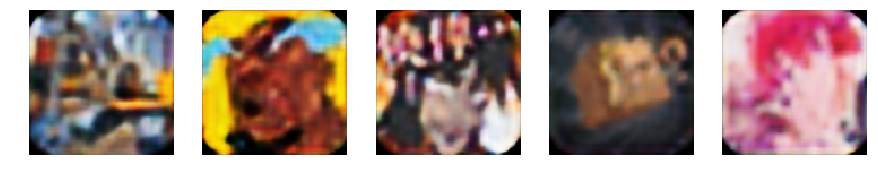

In [7]:
# 检查 autoencoder 的效果

def plot_some(im_list):
    plt.figure(figsize=(15,4))
    for i, array in enumerate(im_list):
        plt.subplot(1, len(im_list), i+1)
        plt.imshow(array)
        plt.axis('off')
    plt.show()

img_decoded = model.predict(X[:5])

print('Before autoencoding:')
plot_some(X[:5])
print('After decoding:')
plot_some(img_decoded)

In [8]:
# 保存模型, 方便下次调用

model.save('taptap-logo-autoencoder-model.h5')

In [9]:
# 取 100 个样本来做下分析

X_sample = X[:100]
print(X_sample.shape)

(100, 128, 128, 3)


In [10]:
# 创建一个获取图片 encoded 结果的函数, 即取模型的 encoder 部分 (前六层)
# Keras 如何获取中间层, 参考官方文档:
# https://keras.io/zh/getting-started/faq/#how-can-i-obtain-the-output-of-an-intermediate-layer
get_encoded = K.function([model.layers[0].input], [model.layers[5].output])

# 获取样本的 encoded 结果
encoded_sample = get_encoded([X_sample])[0]

print(encoded_sample.shape)

(100, 16, 16, 8)


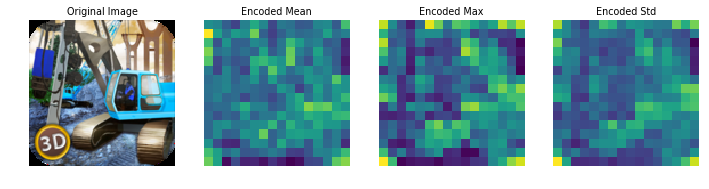

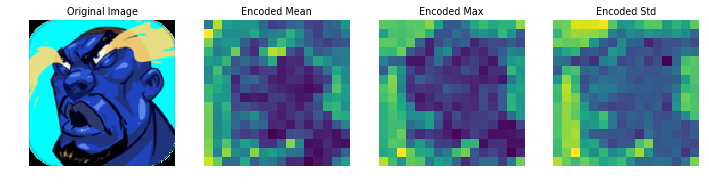

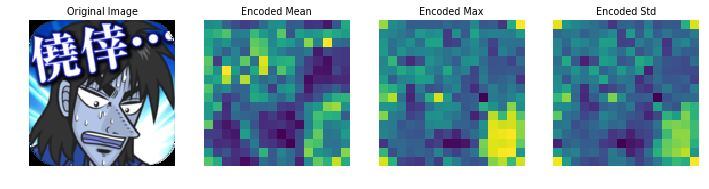

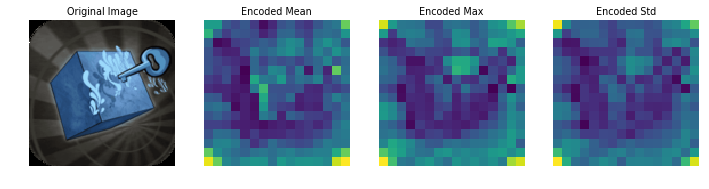

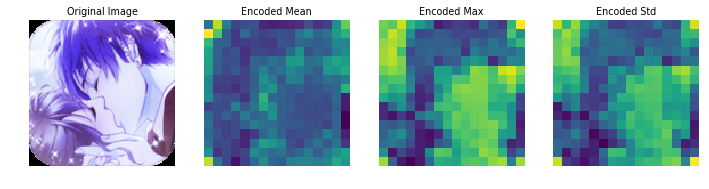

In [11]:
# 看下 encode 之后的图片是什么情况
# 因为 shape 是 16*16*8, 因此需要转成灰度才能将图片显示出来, 分别将最后的维度用 mean, max, std 来取值
# 从结果来看, 部分图片隐约还能看到个轮廓

for n_image in range(0, 5):
    
    plt.figure(figsize=(12,4))

    plt.subplot(1,4,1)
    plt.imshow(X_sample[n_image][:,:,::-1])
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1,4,2)
    plt.imshow(encoded_sample[n_image].mean(axis=-1))
    plt.axis('off')
    plt.title('Encoded Mean')

    plt.subplot(1,4,3)
    plt.imshow(encoded_sample[n_image].max(axis=-1))
    plt.axis('off')
    plt.title('Encoded Max')

    plt.subplot(1,4,4)
    plt.imshow(encoded_sample[n_image].std(axis=-1))
    plt.axis('off')
    plt.title('Encoded Std')

    plt.show()

In [12]:
# 所有图片 encoded 之后的数据

X_encoded = np.empty((len(X), 16, 16, 8), dtype='float32')

step = 100
for i in range(0, len(X), step):
    x_batch = get_encoded([X[i:i+step]])[0]
    X_encoded[i:i+step] = x_batch

print(X_encoded.shape)

(46735, 16, 16, 8)


In [13]:
# reshape, 其实相当于 flatten, 之后给 KMeans 用

X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2]*X_encoded.shape[3])
print(X_encoded_reshape.shape)

(46735, 2048)


In [14]:
# KMeans 聚类

n_clusters = 100

km = KMeans(n_clusters=n_clusters)
km.fit(X_encoded_reshape)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=100, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

<Container object of 100 artists>

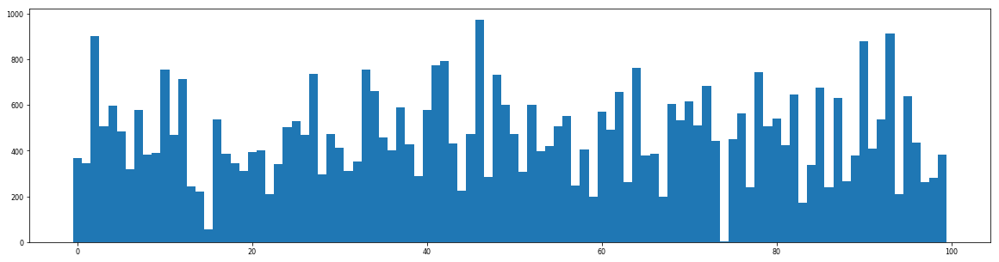

In [15]:
# 看下 clusters 的分布结果

plt.figure(figsize=(20,5))
cluster_elements = [(km.labels_==i).sum() for i in range(n_clusters)]
plt.bar(range(n_clusters), cluster_elements, width=1)

In [16]:
# 每个聚类的 encoded 均值

average_clusters_encoded = []
for i in range(n_clusters):
    average_clusters_encoded.append(X_encoded[km.labels_==i].mean(axis=0))

average_clusters_encoded = np.asarray(average_clusters_encoded)

print(average_clusters_encoded.shape)

(100, 16, 16, 8)


In [17]:
# 取出模型的 decoder 部分

get_decoded = K.function([model.layers[6].input],
                         [model.layers[-1].output])

# "平均" decoded 图像
decoded_clusters = get_decoded([average_clusters_encoded])

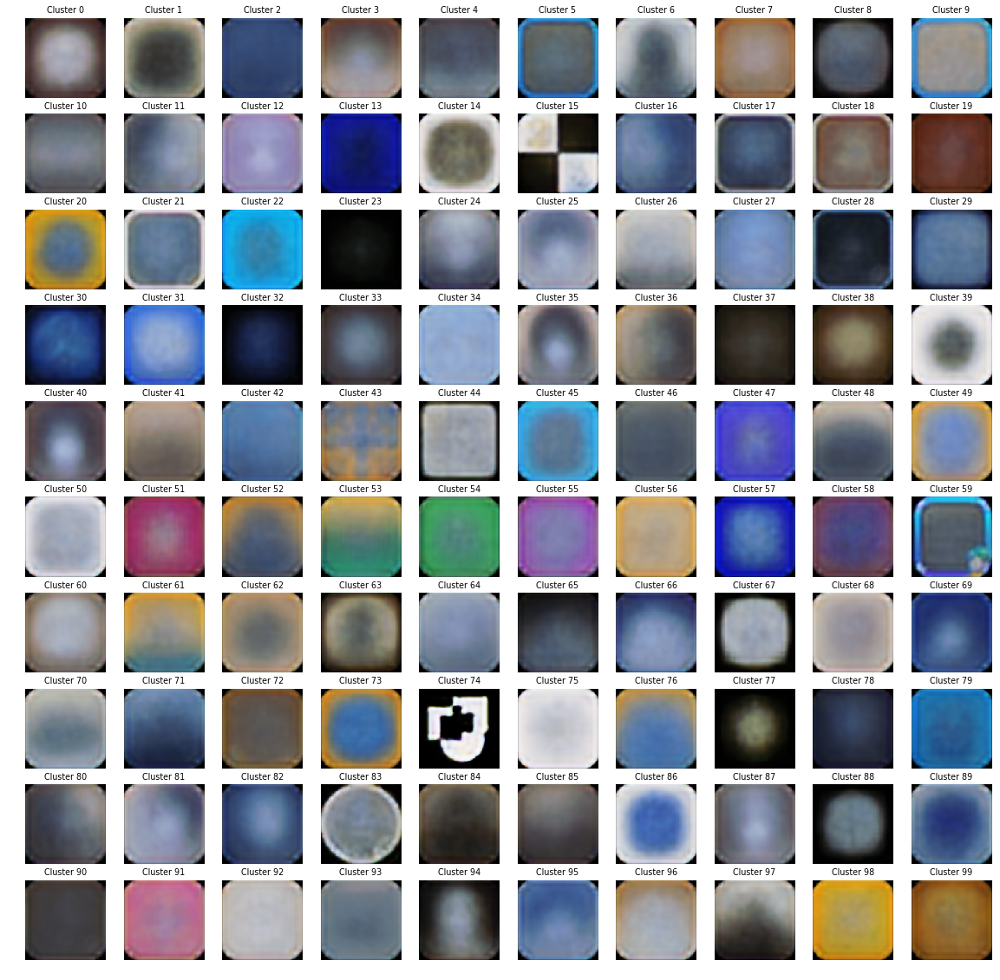

In [18]:
# 打印出所有聚类的" 平均" decoded 图像

plt.figure(figsize=(20,20))

for i in range(n_clusters):
    plt.subplot(10, 10, i+1)
    plt.imshow(decoded_clusters[0][i][:,:,::-1])
    plt.title('Cluster {}'.format(i))
    plt.axis('off')

plt.show()

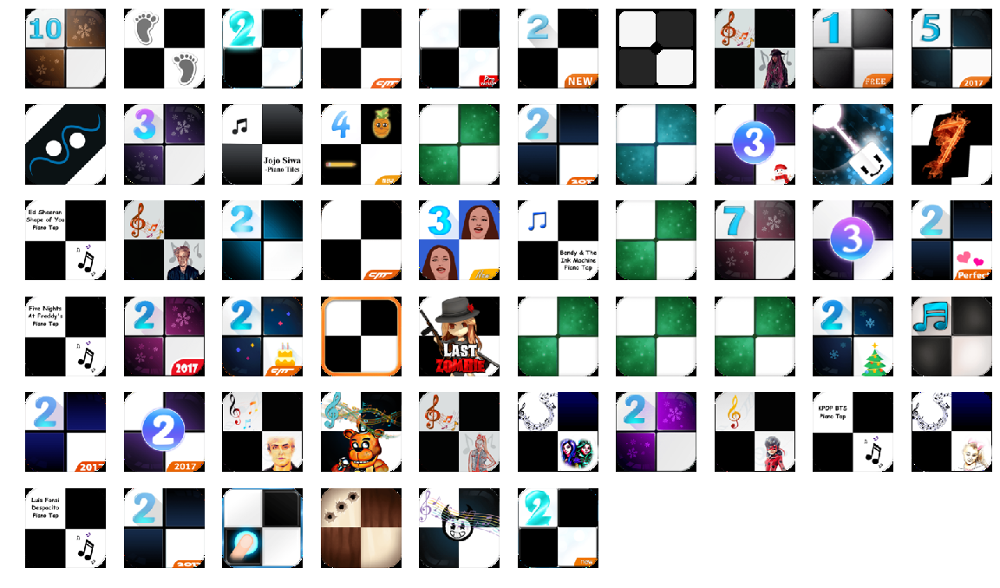

In [20]:
# 从上面可以看到有比较明显的聚类效果

# 比如 cluster 15 基本上都是 4 个黑白方块交叉组成的图形

plt.figure(figsize=(20, 20))

cluster = 15
rows, cols = 10, 10
start = 0

labels = np.where(km.labels_==cluster)[0][start:start+rows*cols]
for i, label in enumerate(labels):
    plt.subplot(rows, cols, i+1)
    plt.imshow(X[label])
    plt.axis('off')

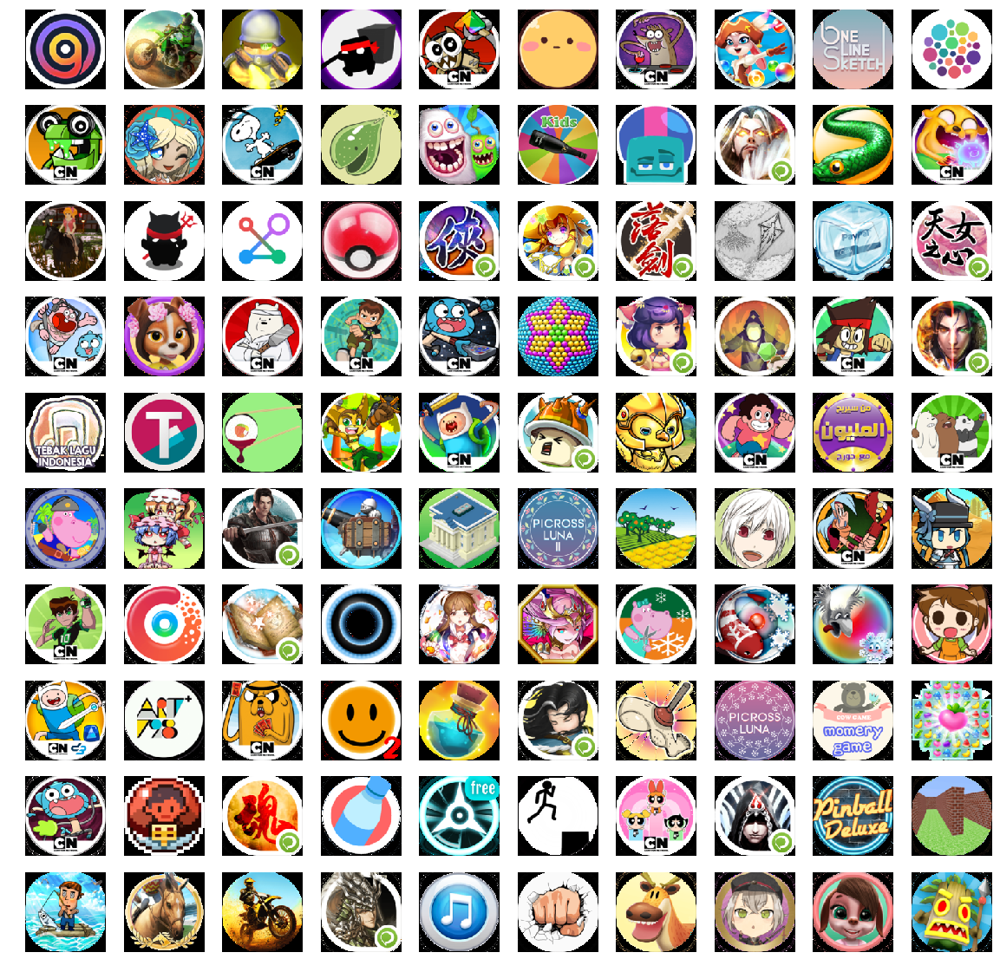

In [21]:
# cluster 83 基本上都是 中央有个圆形

plt.figure(figsize=(20, 20))

cluster = 83
rows, cols = 10, 10
start = 0

labels = np.where(km.labels_==cluster)[0][start:start+rows*cols]
for i, label in enumerate(labels):
    plt.subplot(rows, cols, i+1)
    plt.imshow(X[label])
    plt.axis('off')

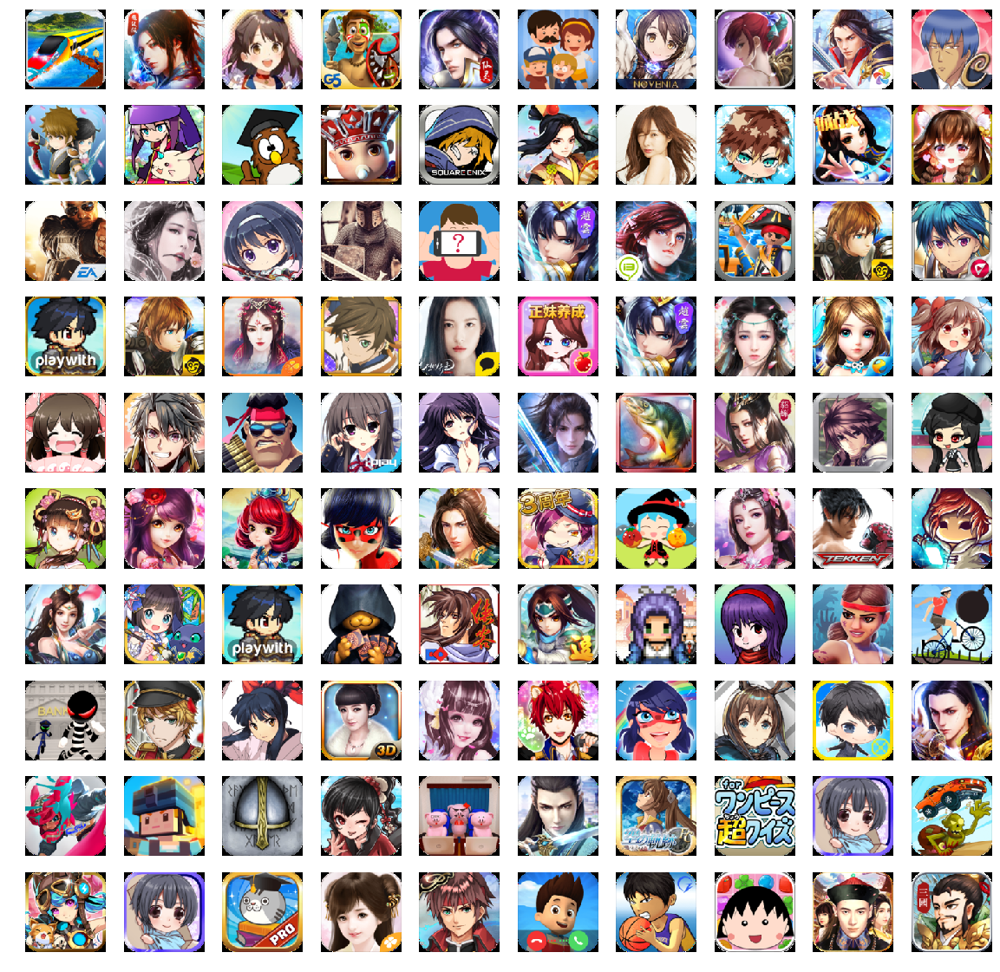

In [22]:
# 比如 cluster 35 基本上都是圆角方框加人物头像

plt.figure(figsize=(20, 20))

cluster = 35
rows, cols = 10, 10
start = 0

labels = np.where(km.labels_==cluster)[0][start:start+rows*cols]
for i, label in enumerate(labels):
    plt.subplot(rows, cols, i+1)
    plt.imshow(X[label])
    plt.axis('off')

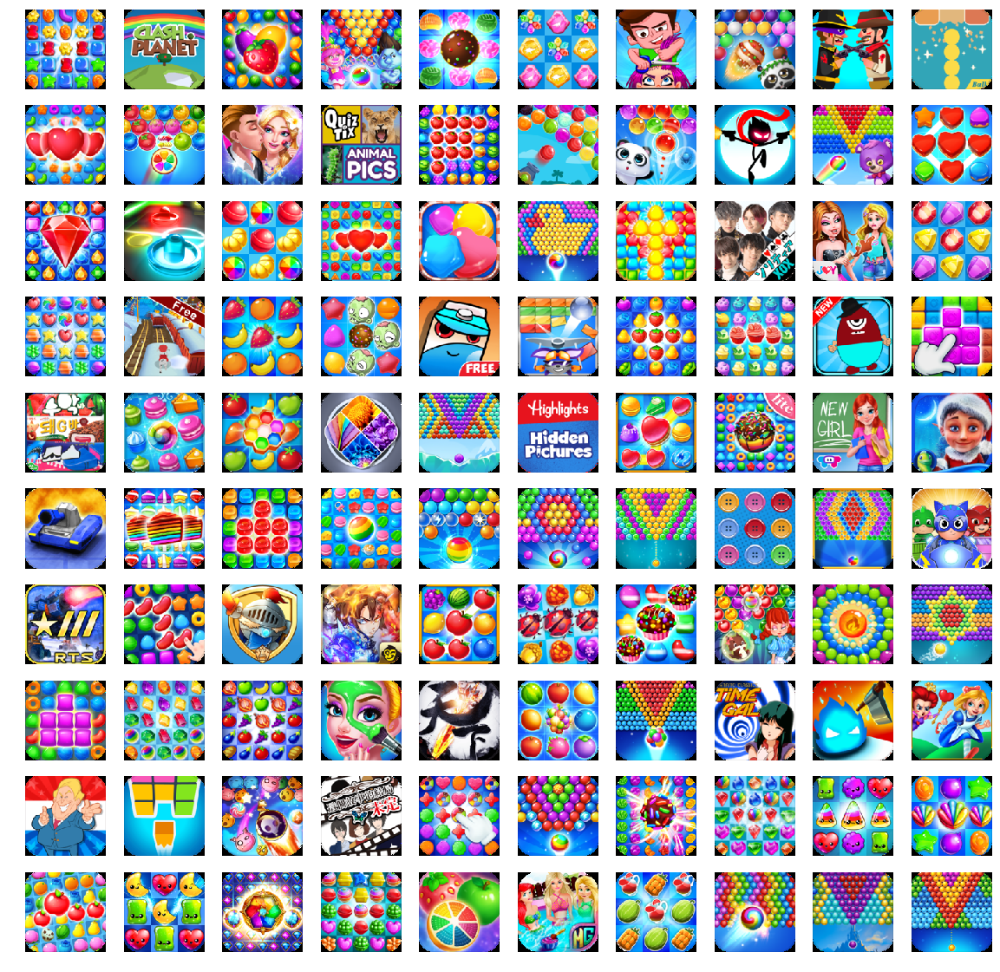

In [24]:
# cluster 43 基本上都是 色彩斑斓的彩块

plt.figure(figsize=(20, 20))

cluster = 43
rows, cols = 10, 10
start = 0

labels = np.where(km.labels_==cluster)[0][start:start+rows*cols]
for i, label in enumerate(labels):
    plt.subplot(rows, cols, i+1)
    plt.imshow(X[label])
    plt.axis('off')

In [39]:
# 保存分类结果

pickle.dump(km, open('km_encoded.sav', 'wb'))

In [47]:
# autoencoder 各层输出

get_1st_layer  = K.function([model.layers[0].input], [model.layers[0].output])
get_2nd_layer  = K.function([model.layers[0].input], [model.layers[1].output])
get_3rd_layer  = K.function([model.layers[0].input], [model.layers[2].output])
get_4th_layer  = K.function([model.layers[0].input], [model.layers[3].output])
get_5th_layer  = K.function([model.layers[0].input], [model.layers[4].output])
get_6th_layer  = K.function([model.layers[0].input], [model.layers[5].output])
get_7th_layer  = K.function([model.layers[0].input], [model.layers[6].output])
get_8th_layer  = K.function([model.layers[0].input], [model.layers[7].output])
get_9th_layer  = K.function([model.layers[0].input], [model.layers[8].output])
get_10th_layer = K.function([model.layers[0].input], [model.layers[9].output])
get_11th_layer = K.function([model.layers[0].input], [model.layers[10].output])

sample_layer_1  = get_1st_layer([X_sample])[0]
sample_layer_2  = get_2nd_layer([X_sample])[0]
sample_layer_3  = get_3rd_layer([X_sample])[0]
sample_layer_4  = get_4th_layer([X_sample])[0]
sample_layer_5  = get_5th_layer([X_sample])[0]
sample_layer_6  = get_6th_layer([X_sample])[0]
sample_layer_7  = get_7th_layer([X_sample])[0]
sample_layer_8  = get_8th_layer([X_sample])[0]
sample_layer_9  = get_9th_layer([X_sample])[0]
sample_layer_10 = get_10th_layer([X_sample])[0]
sample_layer_11 = get_11th_layer([X_sample])[0]
img_decoded = model.predict(X_sample)

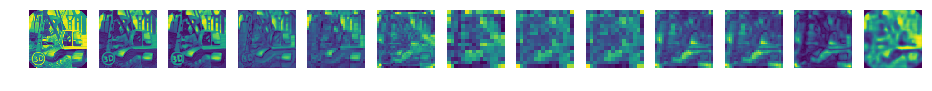

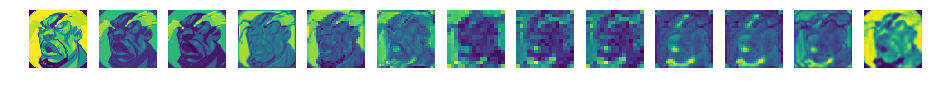

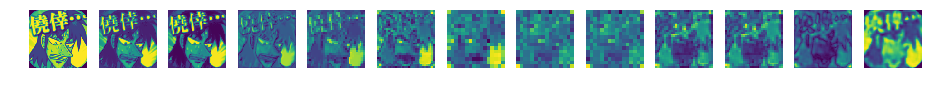

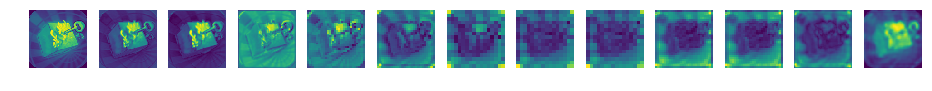

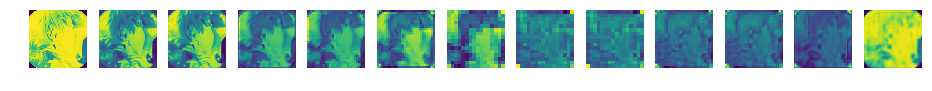

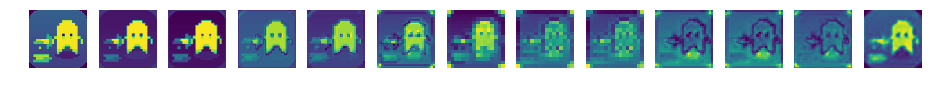

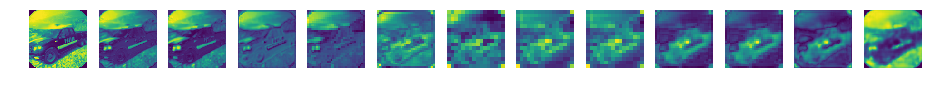

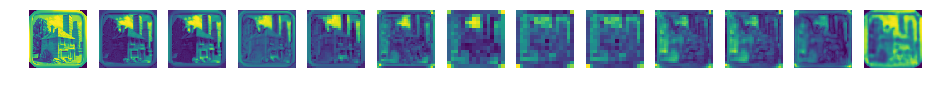

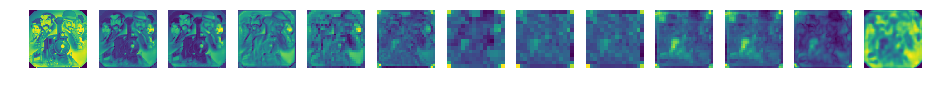

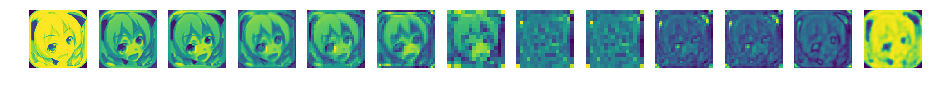

In [48]:
# 打印出中间层图片

for n_image in range(0, 10):
    
    plt.figure(figsize=(16,8))

    plt.subplot(1,13,1)
    plt.imshow(X_sample[n_image].max(axis=-1))
    plt.axis('off')

    plt.subplot(1,13,2)
    plt.imshow(sample_layer_1[n_image].max(axis=-1))
    plt.axis('off')

    plt.subplot(1,13,3)
    plt.imshow(sample_layer_2[n_image].max(axis=-1))
    plt.axis('off')

    plt.subplot(1,13,4)
    plt.imshow(sample_layer_3[n_image].max(axis=-1))
    plt.axis('off')

    plt.subplot(1,13,5)
    plt.imshow(sample_layer_4[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,6)
    plt.imshow(sample_layer_5[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,7)
    plt.imshow(sample_layer_6[n_image].max(axis=-1))
    plt.axis('off')

    plt.subplot(1,13,8)
    plt.imshow(sample_layer_7[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,9)
    plt.imshow(sample_layer_8[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,10)
    plt.imshow(sample_layer_9[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,11)
    plt.imshow(sample_layer_10[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,12)
    plt.imshow(sample_layer_11[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.subplot(1,13,13)
    plt.imshow(img_decoded[n_image].max(axis=-1))
    plt.axis('off')
    
    plt.show()